In [1]:
import pandas as pd

In [2]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df = pd.read_csv("/content/drive/MyDrive/DIC/US_Accidents_March23.csv",nrows = 1000000)

In [5]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


1. Dropping unrelated columns from the dataset

In [6]:
df = df.drop(['Source','ID','Country'],axis = 1)

2.Checking for null values in each column in the dataset

In [7]:
df.isnull().sum()

Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  1000000
End_Lng                  1000000
Distance(mi)                   0
Description                    1
Street                      1712
City                          28
County                         0
State                          0
Zipcode                      136
Timezone                     451
Airport_Code                1432
Weather_Timestamp           9927
Temperature(F)             15298
Wind_Chill(F)             460589
Humidity(%)                16553
Pressure(in)               12376
Visibility(mi)             18931
Wind_Direction             13570
Wind_Speed(mph)           100398
Precipitation(in)         475316
Weather_Condition          18211
Amenity                        0
Bump                           0
Crossing                       0
Give_Way                       0
Junction  

Dropping End latitute and longitude as they contains all null values

In [8]:
dataset = df.drop(['End_Lat','End_Lng'],axis = 1)

#3. Data imputation with Last observation carried forward method

In [9]:
for column in dataset.columns:
  dataset[column] = dataset[column].fillna(method='ffill')

Checking for null after imputation

In [10]:
dataset.isnull().sum()

Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Description              0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Wind_Chill(F)            2
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          2
Precipitation(in)        0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Turning_Loop             0
S

dropping remaining null values

In [11]:
dataset.dropna(inplace = True)

verifying the null values removal process on the dataset

In [12]:
dataset.isnull().sum()

Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Description              0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Wind_Chill(F)            0
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          0
Precipitation(in)        0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Turning_Loop             0
S

data error detection https://builtin.com/data-science/data-analysis-errors

#4 .**Data Error Detection**

Verifying the temperature column based on the minimum temperature required for assessing. Worlds lowest temp is -127F and highest recorded temp is 134F

In [13]:
df.columns

Index(['Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Street', 'City',
       'County', 'State', 'Zipcode', 'Timezone', 'Airport_Code',
       'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)',
       'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [14]:
min(list(dataset['Temperature(F)']))

-77.8

In [15]:
max(list(dataset['Temperature(F)']))

196.0

In [16]:
min(list(dataset['Wind_Chill(F)']))

-50.0

In [17]:
max(list(dataset['Wind_Chill(F)']))

196.0

In [18]:
min(list(dataset['Humidity(%)']))

1.0

In [19]:
max(list(dataset['Humidity(%)']))

100.0

In [20]:
min(list(dataset['Pressure(in)']))

0.12

In [21]:
max(list(dataset['Pressure(in)']))

58.1

In [22]:
min(list(dataset['Visibility(mi)']))

0.0

In [23]:
max(list(dataset['Visibility(mi)']))

111.0

In [24]:
dataset.head()

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,City,County,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.01,Accident on OH-32 State Route 32 Westbound at ...,State Route 32,Williamsburg,Clermont,...,False,False,False,False,True,False,Night,Night,Day,Day
3,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,0.01,Accident on I-75 Southbound at Exits 52 52B US...,I-75 S,Dayton,Montgomery,...,False,False,False,False,False,False,Night,Day,Day,Day
4,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,0.01,Accident on McEwen Rd at OH-725 Miamisburg Cen...,Miamisburg Centerville Rd,Dayton,Montgomery,...,False,False,False,False,True,False,Day,Day,Day,Day
5,3,2016-02-08 07:44:26,2016-02-08 08:14:26,40.100590,-82.925194,0.01,Accident on I-270 Outerbelt Northbound near Ex...,Westerville Rd,Westerville,Franklin,...,False,False,False,False,False,False,Day,Day,Day,Day
6,2,2016-02-08 07:59:35,2016-02-08 08:29:35,39.758274,-84.230507,0.00,Accident on Oakridge Dr at Woodward Ave. Expec...,N Woodward Ave,Dayton,Montgomery,...,False,False,False,False,False,False,Day,Day,Day,Day


#5.Handling data with a high cardinality



In [25]:
print(dataset.Weather_Condition.unique())

['Overcast' 'Mostly Cloudy' 'Light Rain' 'Rain' 'Light Snow' 'Haze'
 'Scattered Clouds' 'Partly Cloudy' 'Clear' 'Snow'
 'Light Freezing Drizzle' 'Light Drizzle' 'Fog' 'Shallow Fog' 'Heavy Rain'
 'Light Freezing Rain' 'Cloudy' 'Drizzle' 'Light Rain Showers' 'Mist'
 'Smoke' 'Patches of Fog' 'Light Freezing Fog' 'Light Haze'
 'Light Thunderstorms and Rain' 'Thunderstorms and Rain' 'Fair'
 'Volcanic Ash' 'Blowing Sand' 'Blowing Dust / Windy' 'Widespread Dust'
 'Fair / Windy' 'Rain Showers' 'Mostly Cloudy / Windy'
 'Light Rain / Windy' 'Hail' 'Heavy Drizzle' 'Showers in the Vicinity'
 'Thunderstorm' 'Light Rain Shower' 'Light Rain with Thunder'
 'Partly Cloudy / Windy' 'Thunder in the Vicinity' 'T-Storm'
 'Heavy Thunderstorms and Rain' 'Thunder' 'Heavy T-Storm' 'Funnel Cloud'
 'Heavy T-Storm / Windy' 'Blowing Snow' 'Light Thunderstorms and Snow'
 'Heavy Snow' 'Low Drifting Snow' 'Light Ice Pellets' 'Ice Pellets'
 'Squalls' 'N/A Precipitation' 'Cloudy / Windy' 'Light Fog' 'Sand'
 'Snow Grain

In [26]:
import numpy as np

In [27]:
dataset.loc[dataset["Weather_Condition"].str.contains("N/A Precipitation", na=False), "Weather_Condition"] = np.nan
dataset.loc[dataset["Weather_Condition"].str.contains("Snow|Sleet|Wintry", na=False), "Weather_Condition"] = "Snow"
dataset.loc[dataset["Weather_Condition"].str.contains("Smoke|Volcanic Ash", na=False), "Weather_Condition"] = "Smoke"
dataset.loc[dataset["Weather_Condition"].str.contains("Cloud|Overcast", na=False), "Weather_Condition"] = "Cloudy"
dataset.loc[dataset["Weather_Condition"].str.contains("Sand|Dust", na=False), "Weather_Condition"] = "Sand"
dataset.loc[dataset["Weather_Condition"].str.contains("Wind|Squalls", na=False), "Weather_Condition"] = "Windy"
dataset.loc[dataset["Weather_Condition"].str.contains("Mist|Haze|Fog", na=False), "Weather_Condition"] = "Fog"
dataset.loc[dataset["Weather_Condition"].str.contains("Thunder|T-Storm", na=False), "Weather_Condition"] = "Thunderstorm"
dataset.loc[dataset["Weather_Condition"].str.contains("Rain|Drizzle|Shower", na=False), "Weather_Condition"] = "Rain"
dataset.loc[dataset["Weather_Condition"].str.contains("Hail|Pellets", na=False), "Weather_Condition"] = "Hail"
dataset.loc[dataset["Weather_Condition"].str.contains("Fair", na=False), "Weather_Condition"] = "Clear"

print('Unique values:',dataset["Weather_Condition"].unique())

Unique values: ['Cloudy' 'Rain' 'Snow' 'Fog' 'Clear' 'Smoke' 'Thunderstorm' 'Sand'
 'Windy' 'Hail' nan 'Tornado']


#6. Data type changing

Converting Boolean Columns to Integer
The dataset includes several boolean columns (like 'Amenity', 'Bump', 'Crossing', etc.) which are currently marked as True/False. For analysis, it might be easier to work with these columns as 1/0.

In [28]:
boolean_columns = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
                   'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop']

for column in boolean_columns:
    dataset[column] = dataset[column].astype(int)


Required columns to change from "Object" type to "Int" type are
1. Nautical Twilight
2. Astronomical Twilight
3. Civil Twilight
4. sunrise_sunset
5. weather condition
6. wind direction
7. street

In [29]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [30]:
object_columns = ['Nautical_Twilight','Astronomical_Twilight','Civil_Twilight','Sunrise_Sunset','Weather_Condition','Wind_Direction','Street']

for col in object_columns:
  if dataset[col].dtype == 'object':
    dataset[col] = encoder.fit_transform(dataset[col])

#7.**Feature Engineering**

In [31]:
dataset.columns

Index(['Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'Distance(mi)', 'Description', 'Street', 'City', 'County', 'State',
       'Zipcode', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [32]:
dataset['Start_Time']

2         2016-02-08 06:49:27
3         2016-02-08 07:23:34
4         2016-02-08 07:39:07
5         2016-02-08 07:44:26
6         2016-02-08 07:59:35
                 ...         
999995    2021-06-10 04:09:01
999996    2021-06-10 04:09:54
999997    2021-06-10 05:17:52
999998    2021-06-10 05:24:46
999999    2021-06-10 05:26:15
Name: Start_Time, Length: 999998, dtype: object

In [33]:
dataset['Start_Time'] = pd.to_datetime(dataset['Start_Time']).dt.time

dataset['time_numeric'] = pd.to_timedelta(dataset['Start_Time'].astype(str)).dt.total_seconds()

dataset['time_normalized'] = (dataset['time_numeric'] - dataset['time_numeric'].min()) / (dataset['time_numeric'].max() - dataset['time_numeric'].min())


In [34]:
dataset['End_Time'] = pd.to_datetime(dataset['End_Time']).dt.time

dataset['time_numeric_night'] = pd.to_timedelta(dataset['End_Time'].astype(str)).dt.total_seconds()

dataset['time_normalized_night'] = (dataset['time_numeric_night'] - dataset['time_numeric_night'].min()) / (dataset['time_numeric_night'].max() - dataset['time_numeric_night'].min())

In [35]:
dataset['time_normalized']

2         0.284344
3         0.308036
4         0.318835
5         0.322527
6         0.333048
            ...   
999995    0.172930
999996    0.173544
999997    0.220743
999998    0.225535
999999    0.226565
Name: time_normalized, Length: 999998, dtype: float64

#8. Text Normalization


In [36]:
# for 'Description' column
dataset['Description'] = dataset['Description'].str.lower() # convert to lower case
dataset['Description'] = dataset['Description'].str.replace('[^\w\s]', '') # remove punctuation

<ipython-input-36-56f192a1299a>:3: FutureWarning: The default value of regex will change from True to False in a future version.
  dataset['Description'] = dataset['Description'].str.replace('[^\w\s]', '') # remove punctuation


In [37]:
dataset

,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,City,County,...,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,time_numeric,time_normalized,time_numeric_night,time_normalized_night
2,2,06:49:27,07:19:27,39.063148,-84.032608,0.01,accident on oh32 state route 32 westbound at d...,72562,Williamsburg,Clermont,...,1,0,1,1,0,0,24567.0,0.284344,26367.0,0.305177
3,3,07:23:34,07:53:34,39.747753,-84.205582,0.01,accident on i75 southbound at exits 52 52b us3...,35393,Dayton,Montgomery,...,0,0,1,0,0,0,26614.0,0.308036,28414.0,0.328870
4,2,07:39:07,08:09:07,39.627781,-84.188354,0.01,accident on mcewen rd at oh725 miamisburg cent...,44841,Dayton,Montgomery,...,1,0,0,0,0,0,27547.0,0.318835,29347.0,0.339668
5,3,07:44:26,08:14:26,40.100590,-82.925194,0.01,accident on i270 outerbelt northbound near exi...,83718,Westerville,Franklin,...,0,0,0,0,0,0,27866.0,0.322527,29666.0,0.343360
6,2,07:59:35,08:29:35,39.758274,-84.230507,0.00,accident on oakridge dr at woodward ave expect...,50590,Dayton,Montgomery,...,0,0,0,0,0,0,28775.0,0.333048,30575.0,0.353881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,2,04:09:01,05:45:47,28.436939,-81.348747,0.00,accident on landstreet rd at boggy creek rd,8792,Orlando,Orange,...,1,0,1,1,1,1,14941.0,0.172930,20747.0,0.240130
999996,2,04:09:54,05:45:44,28.426664,-81.307961,0.00,accident on jeff fuqua blvd at access rd,74887,Orlando,Orange,...,0,0,1,1,1,1,14994.0,0.173544,20744.0,0.240095
999997,2,05:17:52,06:42:43,27.765680,-82.641678,0.00,accident on 5th ave at 6th st,2527,Saint Petersburg,Pinellas,...,1,0,1,1,1,0,19072.0,0.220743,24163.0,0.279668
999998,2,05:24:46,06:42:42,27.901506,-82.637878,0.00,accident on i275 eastbound near fl687,34987,Saint Petersburg,Pinellas,...,0,0,1,1,1,0,19486.0,0.225535,24162.0,0.279656


# 9. **Data Normalization**

In [38]:
required_columns = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
                    'Astronomical_Twilight','Civil_Twilight','Sunrise_Sunset','Weather_Condition',
                    'Weather_Condition','Stop']

In [39]:
# from sklearn.model_selection import train_test_split
# X = dataset.drop("Severity",axis = 1)
# y = dataset["Severity"]

In [40]:
dataset[required_columns].dtypes

Amenity                  int64
Bump                     int64
Crossing                 int64
Give_Way                 int64
Junction                 int64
No_Exit                  int64
Railway                  int64
Roundabout               int64
Station                  int64
Stop                     int64
Traffic_Calming          int64
Traffic_Signal           int64
Turning_Loop             int64
Astronomical_Twilight    int64
Civil_Twilight           int64
Sunrise_Sunset           int64
Weather_Condition        int64
Weather_Condition        int64
Stop                     int64
dtype: object

In [41]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
normalized = scaler.fit_transform(dataset[required_columns])

#10. Data split

In [42]:
from sklearn.model_selection import train_test_split
X = dataset.drop("Severity",axis = 1)
y = dataset["Severity"]

In [43]:
x_train,x_test,y_train,y_test = train_test_split(normalized,y,test_size = 0.2)

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing

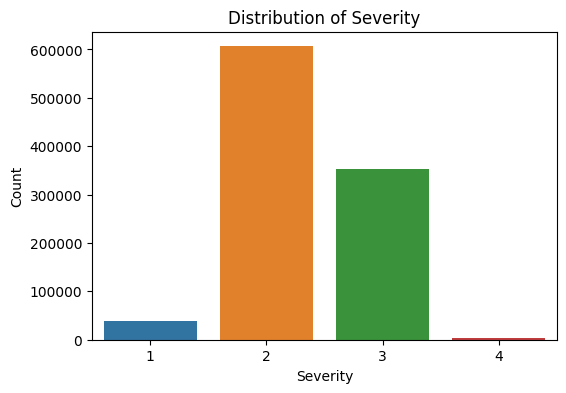

In [45]:
# Univariate Analysis
# Severity - Countplot
plt.figure(figsize=(6, 4))
sns.countplot(data=dataset, x='Severity')
plt.title('Distribution of Severity')
plt.xlabel('Severity')
plt.ylabel('Count')
plt.show()

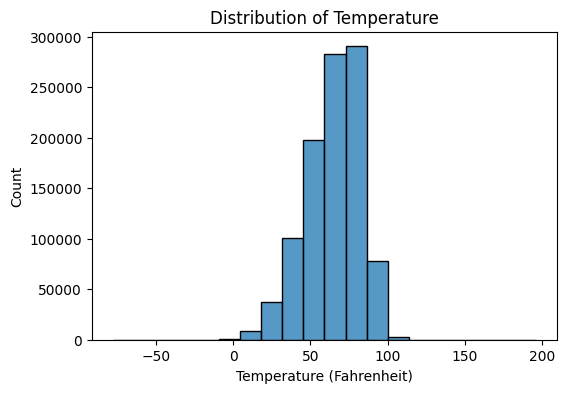

In [46]:
# Temperature(F) - Histogram
plt.figure(figsize=(6, 4))
sns.histplot(data=dataset, x='Temperature(F)', bins=20)
plt.title('Distribution of Temperature')
plt.xlabel('Temperature (Fahrenheit)')
plt.ylabel('Count')
plt.show()

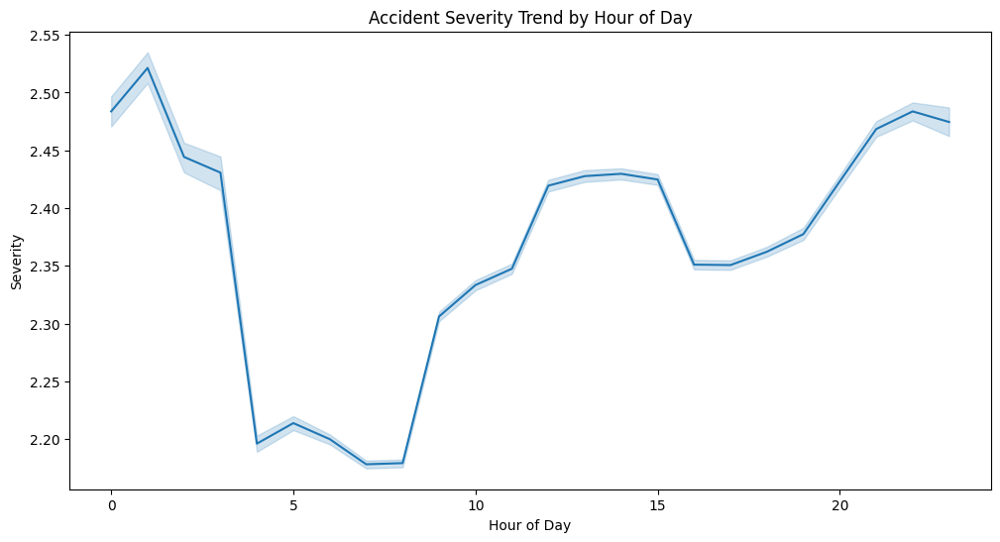

In [47]:
# Severity vs. Hour of Day (derived from Start_Time) - Line Plot
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['Hour_of_Day'] = df['Start_Time'].dt.hour

plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='Hour_of_Day', y='Severity')
plt.title('Accident Severity Trend by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Severity')
plt.show()

# **EXPLORATORY DATA ANALYSIS**

In [48]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999998 entries, 2 to 999999
Data columns (total 45 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Severity               999998 non-null  int64  
 1   Start_Time             999998 non-null  object 
 2   End_Time               999998 non-null  object 
 3   Start_Lat              999998 non-null  float64
 4   Start_Lng              999998 non-null  float64
 5   Distance(mi)           999998 non-null  float64
 6   Description            999998 non-null  object 
 7   Street                 999998 non-null  int64  
 8   City                   999998 non-null  object 
 9   County                 999998 non-null  object 
 10  State                  999998 non-null  object 
 11  Zipcode                999998 non-null  object 
 12  Timezone               999998 non-null  object 
 13  Airport_Code           999998 non-null  object 
 14  Weather_Timestamp      999998 non-nu

1. Distribution of all columns


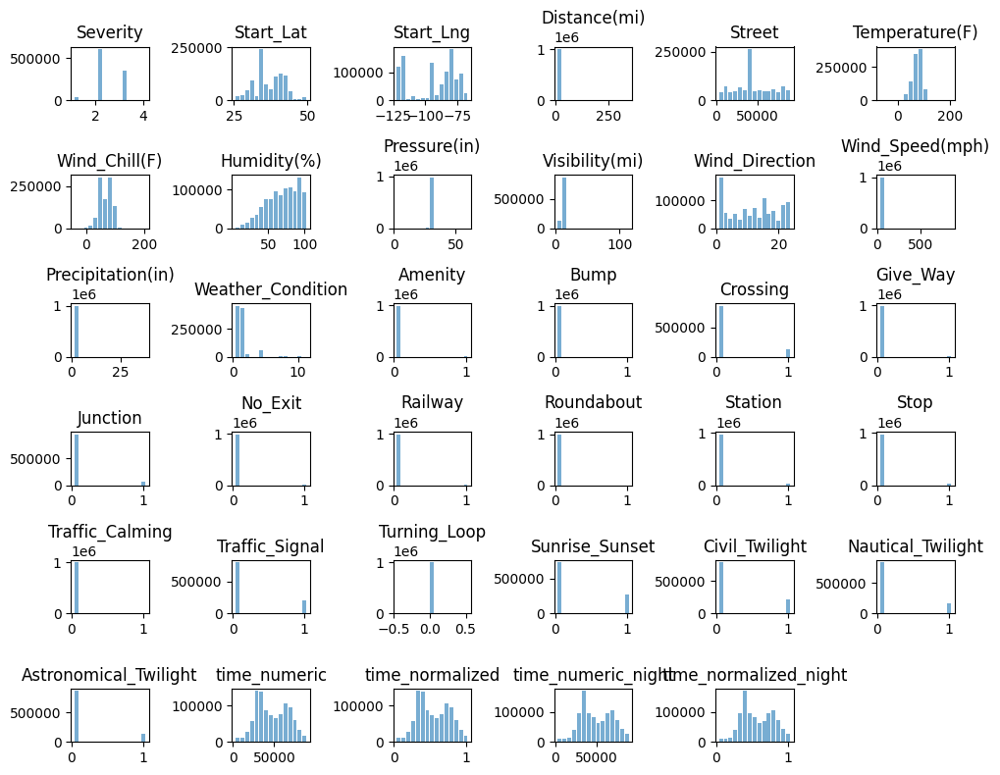

In [49]:
hist = dataset.hist(bins=15,figsize=(10, 8),grid = False,rwidth = 0.8,align='right',histtype= 'barstacked',alpha=0.6,)
plt.title('Distribution of all the columns')
plt.tight_layout()

2. Correlation matrix

In [50]:
#Correlation between the attributes
Co = dataset.corr()
Co.style.background_gradient(cmap='PuBuGn')

<ipython-input-50-8c8d465d29c2>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Co = dataset.corr()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/style.py:3931: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/style.py:3932: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,Severity,Start_Lat,Start_Lng,Distance(mi),Street,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,time_numeric,time_normalized,time_numeric_night,time_normalized_night
Severity,1.000000,0.039645,-0.055181,0.095822,-0.086318,-0.012845,-0.016436,-0.065412,0.020739,-0.006386,0.050663,0.056429,0.019172,0.047596,-0.068937,-0.002930,-0.209398,-0.024719,0.107428,-0.020305,-0.015811,-0.003034,-0.077002,-0.102381,-0.008085,-0.257531,nan,0.022881,0.034304,0.044139,0.049390,0.124899,0.124899,0.115130,0.115130
Start_Lat,0.039645,1.000000,0.064242,0.049838,-0.019064,-0.388141,-0.378507,0.000132,-0.122044,-0.061101,0.106197,0.060375,0.068780,0.084375,0.055826,0.005022,-0.014158,-0.005699,0.048789,0.013528,0.008457,0.002047,0.024750,0.022291,0.004192,-0.068398,nan,0.011910,0.010765,0.004233,0.004833,-0.007148,-0.007148,-0.009253,-0.009253
Start_Lng,-0.055181,0.064242,1.000000,0.051628,0.052336,-0.067283,-0.042029,0.163537,0.076673,-0.031109,-0.058734,0.044201,0.086634,0.103622,0.000053,-0.009662,0.068340,0.027190,-0.079460,0.007193,-0.026363,-0.001393,-0.021129,-0.024953,-0.000259,0.105265,nan,-0.091249,-0.111829,-0.129945,-0.148466,-0.077140,-0.077140,-0.053943,-0.053943
Distance(mi),0.095822,0.049838,0.051628,1.000000,-0.007465,-0.029501,-0.006861,0.015215,-0.066261,-0.011543,-0.006065,0.001083,0.005046,0.025679,-0.011255,-0.001165,-0.037756,-0.001622,0.000239,-0.004090,-0.008909,-0.000610,-0.017584,-0.012084,-0.002305,-0.049067,nan,0.003972,0.004978,0.005029,0.003848,-0.005185,-0.005185,-0.001727,-0.001727
Street,-0.086318,-0.019064,0.052336,-0.007465,1.000000,0.004169,-0.021390,0.008429,0.005496,0.004696,-0.001272,0.017749,0.005463,0.000200,0.002401,-0.002482,0.056793,0.023792,-0.038157,0.004978,0.000202,-0.000528,0.017728,0.019075,-0.000179,0.088068,nan,-0.014606,-0.015095,-0.015360,-0.015107,0.000515,0.000515,0.001430,0.001430
Temperature(F),-0.012845,-0.388141,-0.067283,-0.029501,0.004169,1.000000,0.789859,-0.304982,0.014351,0.193063,0.100489,0.025048,-0.048409,-0.134213,-0.010560,-0.000594,0.014273,0.004641,-0.015494,-0.001932,-0.000803,-0.001179,-0.004296,-0.013831,0.001282,0.028434,nan,-0.287163,-0.253778,-0.218750,-0.191353,0.213243,0.213243,0.224151,0.224151
Wind_Chill(F),-0.016436,-0.378507,-0.042029,-0.006861,-0.021390,0.789859,1.000000,-0.150377,-0.080706,0.128853,0.003232,-0.088415,-0.065592,-0.108160,-0.027479,-0.002242,-0.014760,-0.007091,-0.028706,-0.001463,-0.001109,-0.001862,-0.012544,-0.027642,-0.000181,-0.010646,nan,-0.178418,-0.158169,-0.138371,-0.125360,0.106969,0.106969,0.119682,0.119682
Humidity(%),-0.065412,0.000132,0.163537,0.015215,0.008429,-0.304982,-0.150377,1.000000,0.104948,-0.388847,-0.211036,-0.199880,-0.016334,0.291818,0.000380,-0.001372,0.003454,0.003885,-0.015383,-0.003053,0.001635,0.001499,-0.001058,-0.000291,-0.001899,0.007775,nan,0.230533,0.199101,0.172637,0.150304,-0.344010,-0.344010,-0.347603,-0.347603
Pressure(in),0.020739,-0.122044,0.076673,-0.066261,0.005496,0.014351,-0.080706,0.104948,1.000000,0.015734,0.007949,0.000988,0.035524,-0.067369,0.022632,-0.005509,0.010554,0.005774,0.031752,-0.013299,0.010039,0.000581,0.031910,-0.000623,0.000843,0.025029,nan,0.014453,0.021223,0.029162,0.038527,0.041915,0.041915,0.028675,0.028675
Visibility(mi),-0.006386,-0.061101,-0.031109,-0.011543,0.004696,0.193063,0.128853,-0.388847,0.015734,1.000000,0.110274,0.039425,0.006353,-0.469133,0.006890,0.002537,0.025506,0.000596,-0.000108,0.002096,0.002544,0.001903,0.009082,-0.002898,0.003278,0.025386,nan,-0.034933,-0.025665,-0.021266,-0.018121,0.124008,0.124008,0.121714,0.121714


3.Analyzing the distribution of accidents across different cities and counties to identify areas with high accident rates.

In [51]:
# Calculate accident counts by city
city_counts = dataset['City'].value_counts()

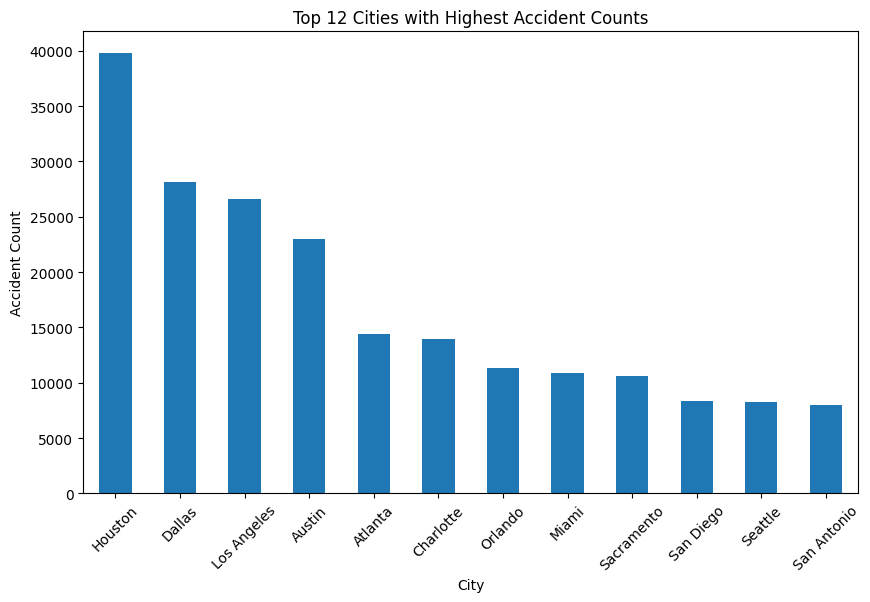

In [52]:
# Plot the top 10 cities with the highest accident counts
top_12_cities = city_counts.head(12)
plt.figure(figsize=(10, 6))
top_12_cities.plot(kind='bar')
plt.xlabel('City')
plt.ylabel('Accident Count')
plt.title('Top 12 Cities with Highest Accident Counts')
plt.xticks(rotation=45)
plt.show()

In [53]:
# Calculate accident counts by county
county_counts = dataset['County'].value_counts()

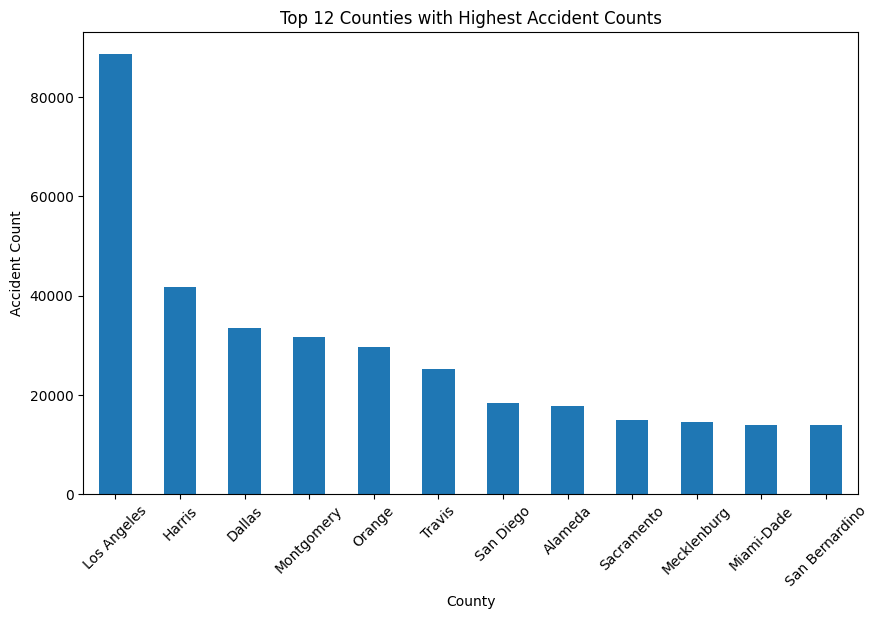

In [54]:
# Plot the top 12 counties with the highest accident counts
top_12_counties = county_counts.head(12)
plt.figure(figsize=(10, 6))
top_12_counties.plot(kind='bar')
plt.xlabel('County')
plt.ylabel('Accident Count')
plt.title('Top 12 Counties with Highest Accident Counts')
plt.xticks(rotation=45)
plt.show()

2.The distribution of accidents across different states to identify states with high accident rates.

In [55]:
# Group the data by 'State' and count the number of accidents
state_accident_counts = dataset.groupby('State').size().sort_values(ascending=False)

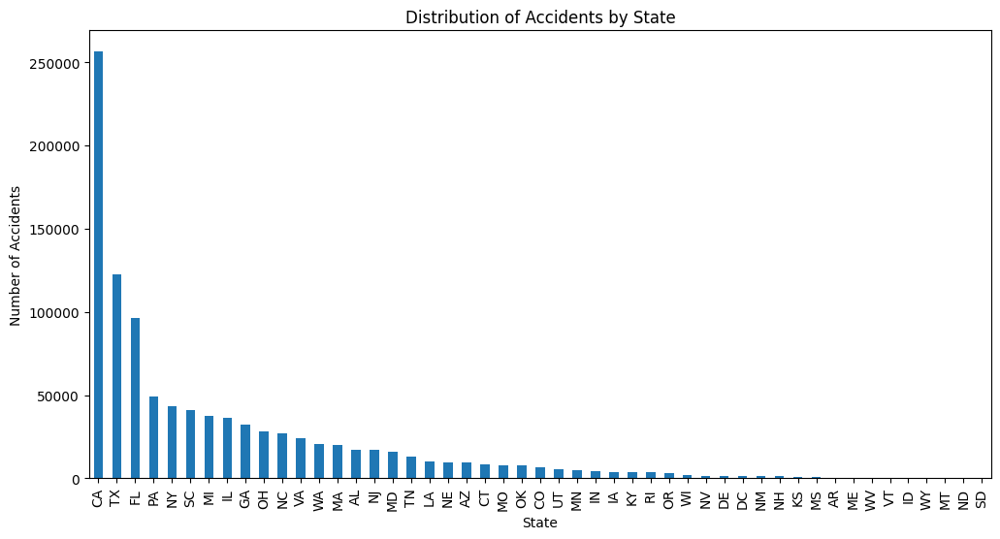

In [56]:
# Plot the distribution of accidents by state
plt.figure(figsize=(12, 6))
state_accident_counts.plot(kind='bar')
plt.xlabel('State')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by State')
plt.xticks(rotation=90)
plt.show()

4. Investigating the relationship between weather conditions (e.g., temperature, humidity, precipitation) and accident severity.



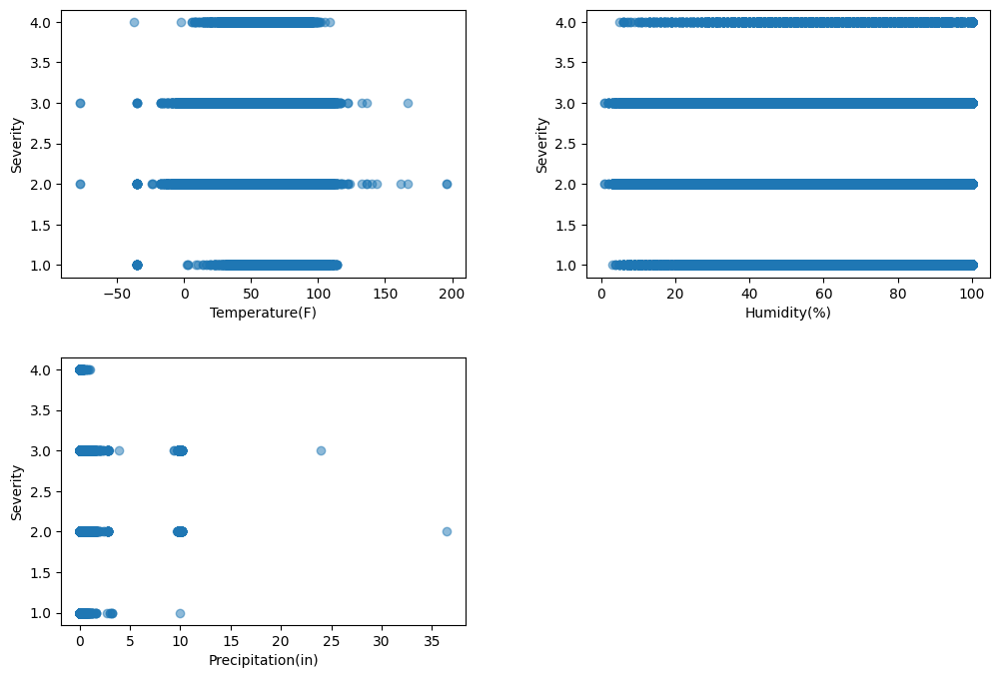

In [57]:
# Extract the relevant columns
weather_columns = ['Temperature(F)', 'Humidity(%)', 'Precipitation(in)', 'Severity']
weather_data = dataset[weather_columns]

# Plot scatter plots for each weather condition
plt.figure(figsize=(12, 8))
plt.subplots_adjust(wspace=0.3, hspace=0.3)

for i, column in enumerate(weather_columns[:-1]):
    plt.subplot(2, 2, i+1)
    plt.scatter(weather_data[column], weather_data['Severity'], alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Severity')

plt.show()

5.Relation between accident severity and various road features

In [58]:
columns_of_interest = ['Severity', 'Crossing', 'Junction', 'Stop', 'Traffic_Signal']
data = dataset[columns_of_interest]


In [59]:
correlation_matrix = data.corr()

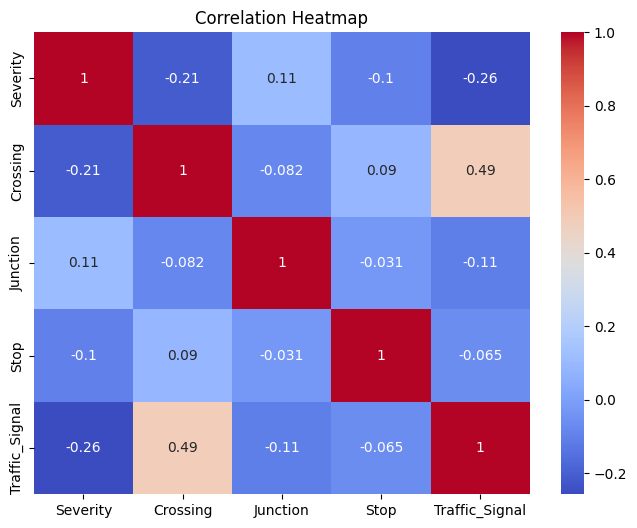

In [60]:
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [61]:
grouped_data = data.groupby(['Crossing', 'Junction', 'Stop', 'Traffic_Signal'])['Severity'].mean().reset_index()
print(grouped_data)



    Crossing  Junction  Stop  Traffic_Signal  Severity
0          0         0     0               0  2.409466
1          0         0     0               1  2.064771
2          0         0     1               0  1.997048
3          0         0     1               1  1.995406
4          0         1     0               0  2.564591
5          0         1     0               1  2.547414
6          0         1     1               0  2.187335
7          0         1     1               1  2.000000
8          1         0     0               0  2.042313
9          1         0     0               1  2.015533
10         1         0     1               0  1.975285
11         1         0     1               1  2.051935
12         1         1     0               0  2.505415
13         1         1     0               1  2.474715
14         1         1     1               0  2.402778
15         1         1     1               1  2.000000


6. Examine the influence of visibility, wind speed, and wind direction on accident rates.

            Severity  Visibility(mi)  Wind_Speed(mph)  Wind_Direction
count  999998.000000   999998.000000    999998.000000   999998.000000
mean        2.320200        9.171980         7.609029       11.034634
std         0.548478        2.260398         5.397516        7.440075
min         1.000000        0.000000         0.000000        0.000000
25%         2.000000       10.000000         4.600000        4.000000
50%         2.000000       10.000000         6.900000       12.000000
75%         3.000000       10.000000        10.400000       17.000000
max         4.000000      111.000000       822.800000       23.000000
                 Severity  Visibility(mi)  Wind_Speed(mph)  Wind_Direction
Severity         1.000000       -0.006386         0.056429        0.050663
Visibility(mi)  -0.006386        1.000000         0.039425        0.110274
Wind_Speed(mph)  0.056429        0.039425         1.000000        0.314513
Wind_Direction   0.050663        0.110274         0.314513        1.00

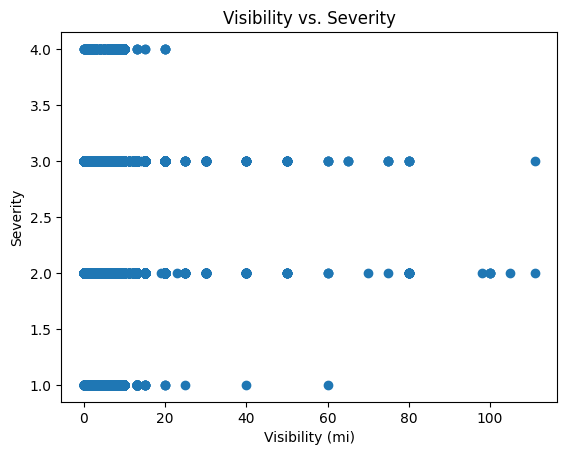

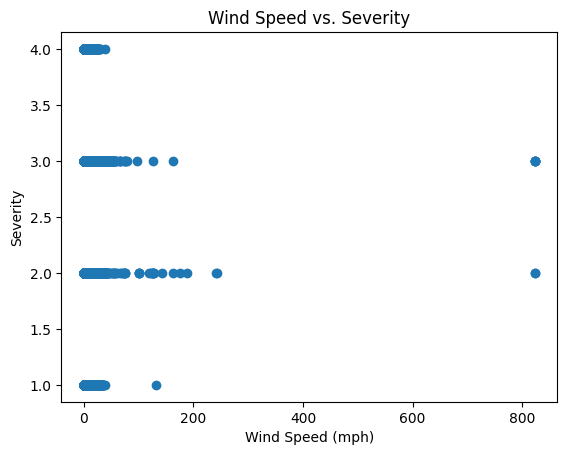

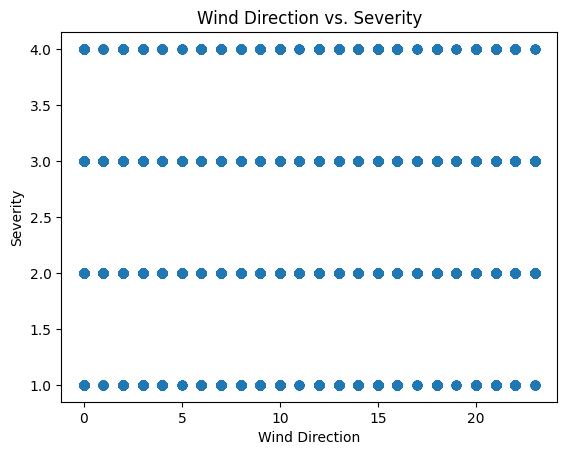

In [62]:
# Select the relevant columns for analysis
columns_of_interest = ['Severity', 'Visibility(mi)', 'Wind_Speed(mph)', 'Wind_Direction']
data = dataset[columns_of_interest]

# Check the summary statistics of the selected columns
print(data.describe())

# Examine the correlation between variables
correlation = data.corr()
print(correlation)

# Create scatter plots to visualize the relationship between variables
plt.scatter(data['Visibility(mi)'], data['Severity'])
plt.xlabel('Visibility (mi)')
plt.ylabel('Severity')
plt.title('Visibility vs. Severity')
plt.show()

plt.scatter(data['Wind_Speed(mph)'], data['Severity'])
plt.xlabel('Wind Speed (mph)')
plt.ylabel('Severity')
plt.title('Wind Speed vs. Severity')
plt.show()

plt.scatter(data['Wind_Direction'], data['Severity'])
plt.xlabel('Wind Direction')
plt.ylabel('Severity')
plt.title('Wind Direction vs. Severity')
plt.show()

7. Explore the relationship between accident severity and airport proximity.


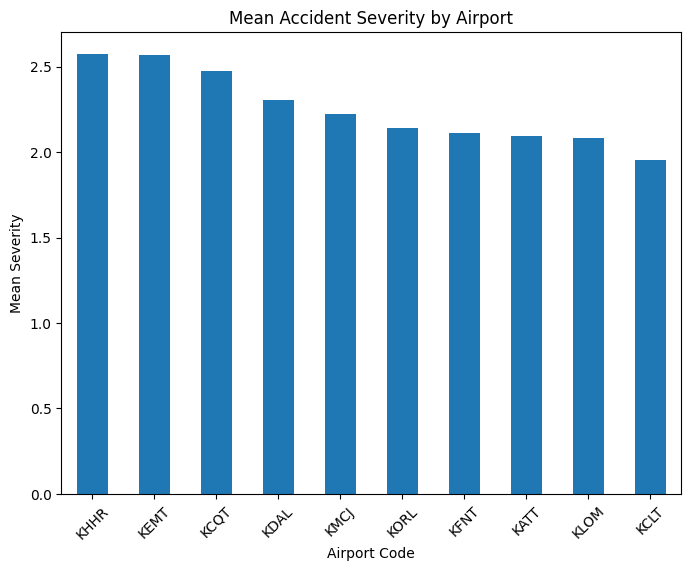

In [63]:
# Perform EDA
severity_vs_airport = dataset[['Severity', 'Airport_Code']]

# Count the occurrences of each airport code
airport_counts = severity_vs_airport['Airport_Code'].value_counts()

# Select the top 10 most frequent airport codes
top_airports = airport_counts.nlargest(10).index

# Filter the dataset for the selected airports
filtered_dataset = dataset[dataset['Airport_Code'].isin(top_airports)]

# Group the filtered data by 'Airport_Code' and calculate the mean severity for each airport
severity_mean_by_airport = filtered_dataset.groupby('Airport_Code')['Severity'].mean()

# Sort the airports based on mean severity in descending order
sorted_airports = severity_mean_by_airport.sort_values(ascending=False)

# Plot the mean severity for each airport
plt.figure(figsize=(8, 6))
sorted_airports.plot(kind='bar')
plt.title('Mean Accident Severity by Airport')
plt.xlabel('Airport Code')
plt.ylabel('Mean Severity')
plt.xticks(rotation=45)
plt.show()



8. Explore the relationship between accident severity and the duration of accidents (using the 'Start_Time' and 'End_Time' columns)

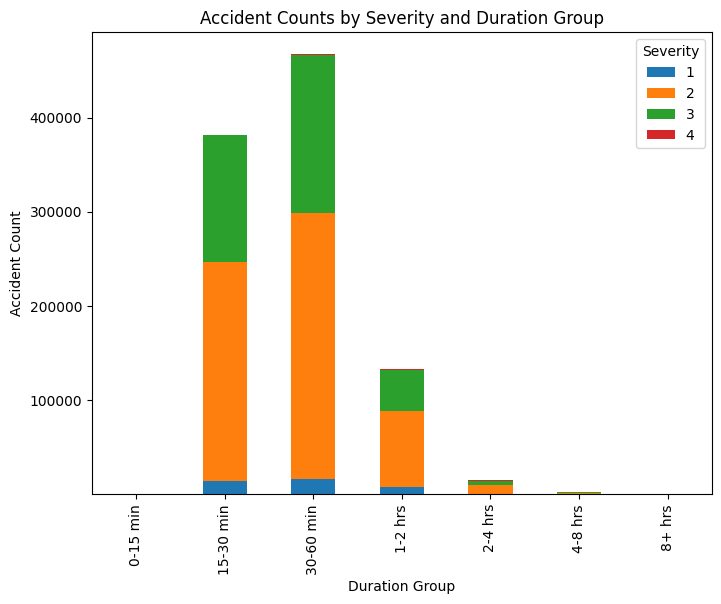

In [64]:
# Convert 'Start_Time' and 'End_Time' columns to datetime
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])

# Calculate duration of accidents in minutes
df['Duration'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds() / 60

# Create bins for duration intervals
bins = [0, 15, 30, 60, 120, 240, 480, float('inf')]
labels = ['0-15 min', '15-30 min', '30-60 min', '1-2 hrs', '2-4 hrs', '4-8 hrs', '8+ hrs']
df['Duration_Group'] = pd.cut(df['Duration'], bins=bins, labels=labels, right=False)

# Grouped bar plot
severity_duration_counts = df.groupby(['Duration_Group', 'Severity'])['Severity'].count().unstack()
severity_duration_counts.plot(kind='bar', stacked=True, figsize=(8, 6))

plt.xlabel('Duration Group')
plt.ylabel('Accident Count')
plt.title('Accident Counts by Severity and Duration Group')
plt.legend(title='Severity')

plt.show()

9.Analysis on the impact of different time factors (e.g., time of day, day of the week, month) on accident occurrence and severity.

In [65]:
# Convert time-related columns to datetime data type
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])
df['Weather_Timestamp'] = pd.to_datetime(df['Weather_Timestamp'])

In [66]:
# Extract time of day, day of the week, and month from Start_Time
df['TimeOfDay'] = df['Start_Time'].dt.hour
df['DayOfWeek'] = df['Start_Time'].dt.dayofweek
df['Month'] = df['Start_Time'].dt.month

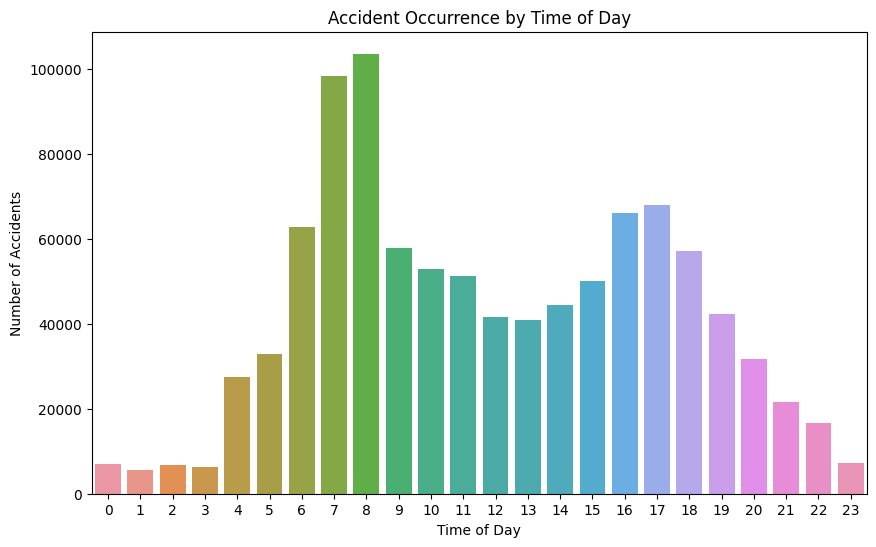

In [67]:
# Analyze accident occurrence by time of day
plt.figure(figsize=(10, 6))
sns.countplot(x='TimeOfDay', data=df)
plt.title('Accident Occurrence by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Accidents')
plt.show()

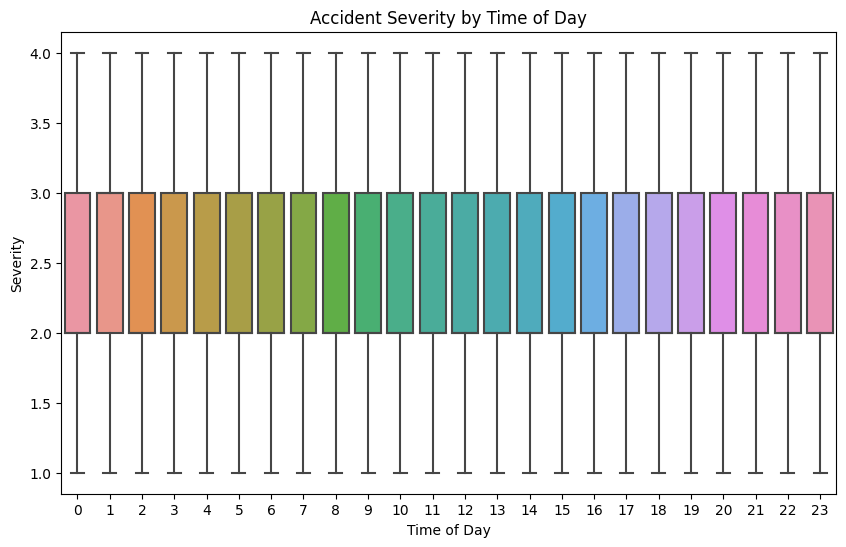

In [68]:
# Analyze accident severity by time of day
plt.figure(figsize=(10, 6))
sns.boxplot(x='TimeOfDay', y='Severity', data=df)
plt.title('Accident Severity by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Severity')
plt.show()

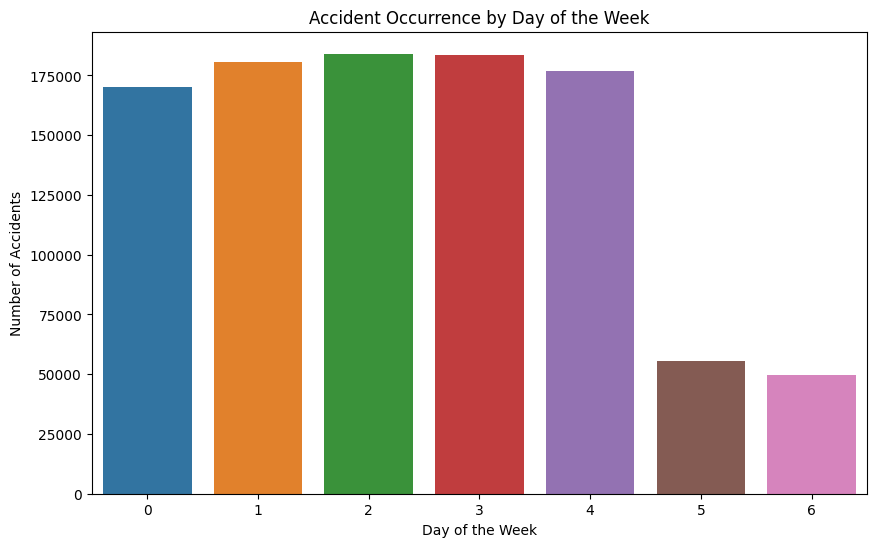

In [69]:
# Analyze accident occurrence by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(x='DayOfWeek', data=df)
plt.title('Accident Occurrence by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.show()

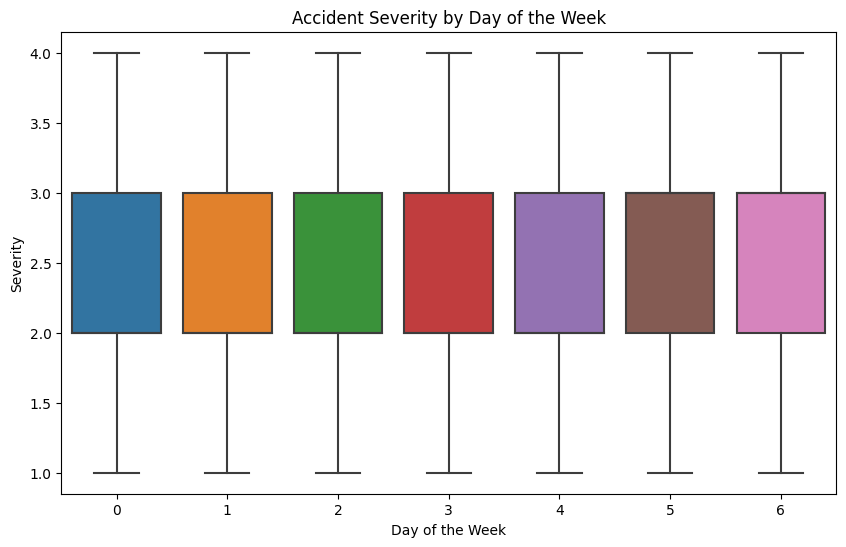

In [70]:
# Analyze accident severity by day of the week
plt.figure(figsize=(10, 6))
sns.boxplot(x='DayOfWeek', y='Severity', data=df)
plt.title('Accident Severity by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Severity')
plt.show()

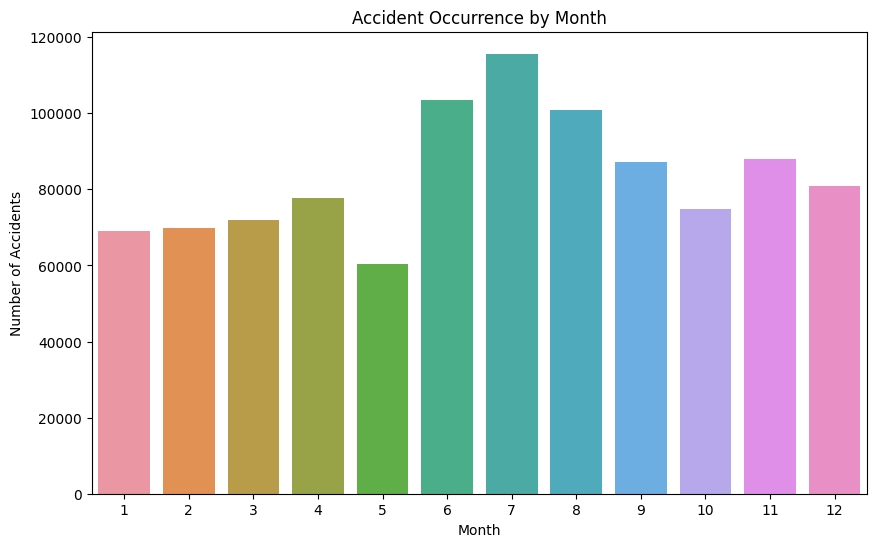

In [71]:
# Analyze accident occurrence by month
plt.figure(figsize=(10, 6))
sns.countplot(x='Month', data=df)
plt.title('Accident Occurrence by Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.show()

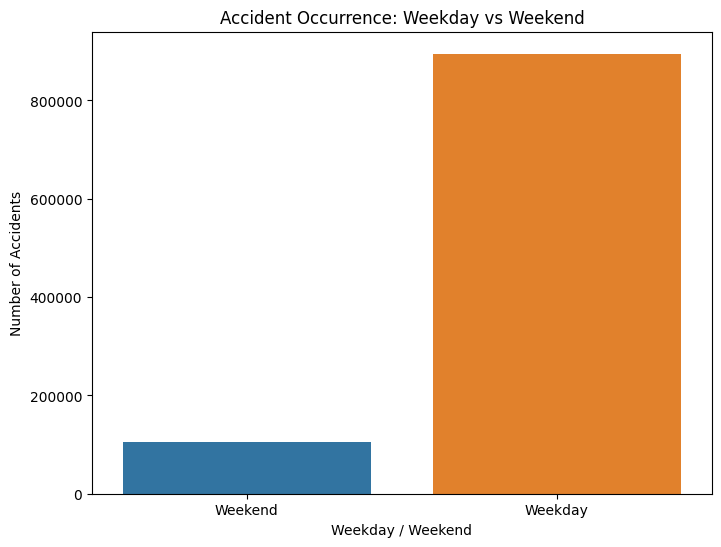

In [72]:
# Analyze accident occurrence on weekdays and weekends
df['Weekday'] = df['Start_Time'].dt.weekday.isin([0, 1, 2, 3, 4])  # True for weekdays, False for weekends

plt.figure(figsize=(8, 6))
sns.countplot(x='Weekday', data=df)
plt.title('Accident Occurrence: Weekday vs Weekend')
plt.xlabel('Weekday / Weekend')
plt.ylabel('Number of Accidents')
plt.xticks([0, 1], ['Weekend', 'Weekday'])
plt.show()


In [73]:
selected_columns = ['Severity', 'Start_Time', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight']
selected_data = dataset[selected_columns]
print(selected_data)


        Severity Start_Time  Sunrise_Sunset  Civil_Twilight  \
2              2   06:49:27               1               1   
3              3   07:23:34               1               0   
4              2   07:39:07               0               0   
5              3   07:44:26               0               0   
6              2   07:59:35               0               0   
...          ...        ...             ...             ...   
999995         2   04:09:01               1               1   
999996         2   04:09:54               1               1   
999997         2   05:17:52               1               1   
999998         2   05:24:46               1               1   
999999         2   05:26:15               1               1   

        Nautical_Twilight  Astronomical_Twilight  
2                       0                      0  
3                       0                      0  
4                       0                      0  
5                       0              

10 .Utilize geographic data to visualize the accident locations on a map and identify areas with higher accident rates

In [74]:
import folium
import pandas as pd

# Create a map centered on the mean latitude and longitude
map_center = [dataset['Start_Lat'].mean(), dataset['Start_Lng'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Create a subset of the dataset for visualization purposes
# Adjust the parameters as needed to focus on specific regions or periods
subset = dataset.sample(n=5000, random_state=42)

# Add markers for accident locations
for index, row in subset.iterrows():
    folium.Marker(
        location=[row['Start_Lat'], row['Start_Lng']],
        popup=row['Description'],
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(m)

# Display the map
m


**Model Training**

KNN


In [75]:
required_columns = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
                    'Astronomical_Twilight','Civil_Twilight','Sunrise_Sunset','Weather_Condition',
                    'Weather_Condition','Stop']

In [76]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
normalized = scaler.fit_transform(dataset[required_columns])

In [77]:
normalized.shape

(999998, 19)

In [78]:
y.shape

(999998,)

In [79]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [80]:
neigh.score(x_test[0:1000],y_test[0:1000], sample_weight=None)

0.49

In [81]:
preds = neigh.predict(x_test[0:1000])

In [82]:
preds2 = neigh.predict_proba(x_test[0:1000])

In [83]:
from sklearn.metrics import ConfusionMatrixDisplay

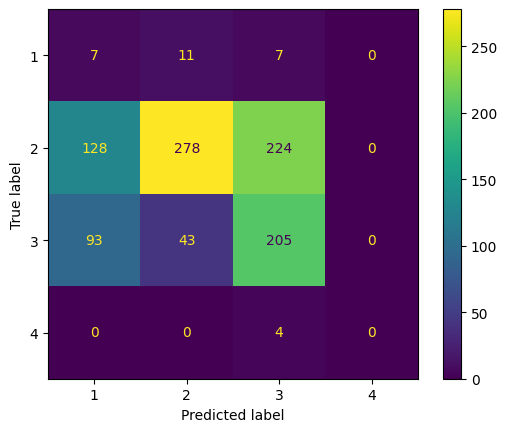

In [84]:
ConfusionMatrixDisplay.from_estimator(neigh, x_test[0:1000],y_test[0:1000])

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle


In [86]:
y_true_bin = label_binarize(y_test[0:1000], classes=np.unique(y_test[0:1000]))
n_classes = y_true_bin.shape[1]

In [87]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

In [88]:
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

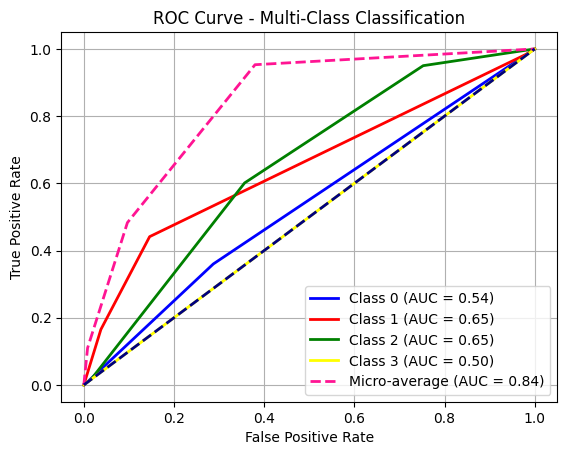

In [92]:
# Plotting the ROC curves for each class
plt.figure()
colors = cycle(['blue', 'red', 'green', 'yellow'])  # You can add more colors if needed
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))

# Plotting the micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', lw=2, linestyle='--', label='Micro-average (AUC = {0:0.2f})'.format(roc_auc["micro"]))

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()


**Logistic Regression**

In [94]:
from sklearn.linear_model import LogisticRegression

In [97]:
clf_logistic_regression = LogisticRegression(random_state=32).fit(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [98]:
clf_logistic_regression.score(x_test[0:1000],y_test[0:1000], sample_weight=None)

0.615

In [99]:
preds2 = clf_logistic_regression.predict_proba(x_test[0:1000])

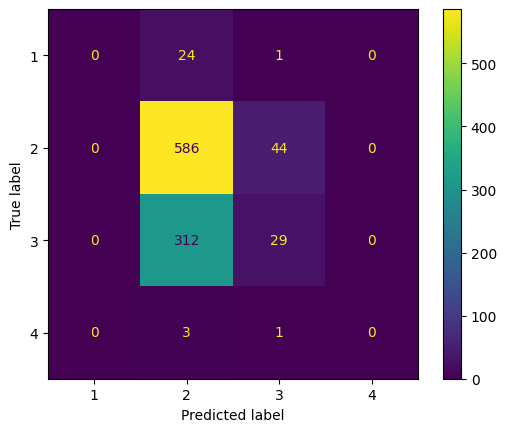

In [100]:
ConfusionMatrixDisplay.from_estimator(clf_logistic_regression, x_test[0:1000],y_test[0:1000])

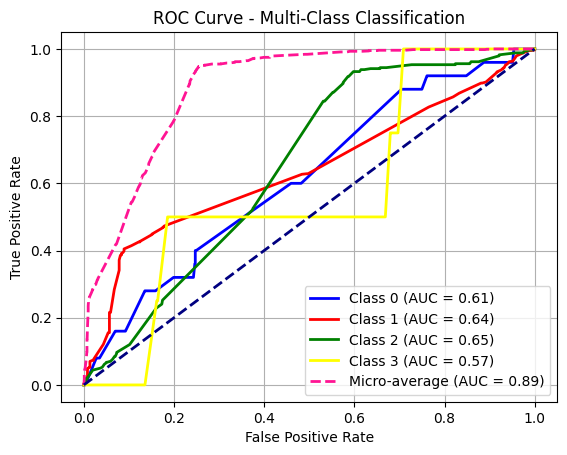

In [102]:
y_true_bin = label_binarize(y_test[0:1000], classes=np.unique(y_test[0:1000]))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plotting the ROC curves for each class
plt.figure()
colors = cycle(['blue', 'red', 'green', 'yellow'])  # You can add more colors if needed
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))

# Plotting the micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', lw=2, linestyle='--', label='Micro-average (AUC = {0:0.2f})'.format(roc_auc["micro"]))

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()


**Decision Tree**

In [103]:
from sklearn import tree

In [104]:
clf_tree = tree.DecisionTreeClassifier()
clf_tree.fit(x_train,y_train)

DecisionTreeClassifier()

In [105]:
clf_tree.score(x_test[0:2000],y_test[0:2000], sample_weight=None)

0.6185

In [106]:
preds2 = clf_tree.predict_proba(x_test[0:1000])

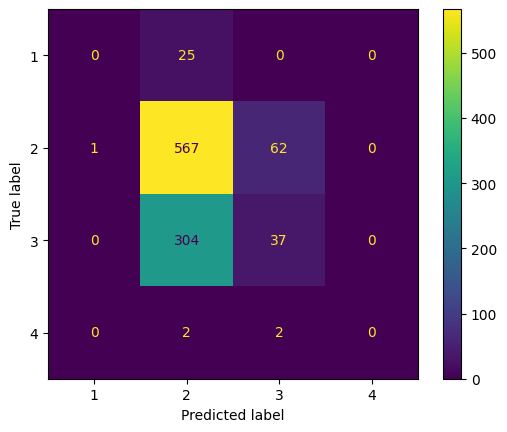

In [107]:
ConfusionMatrixDisplay.from_estimator(clf_tree, x_test[0:1000],y_test[0:1000])

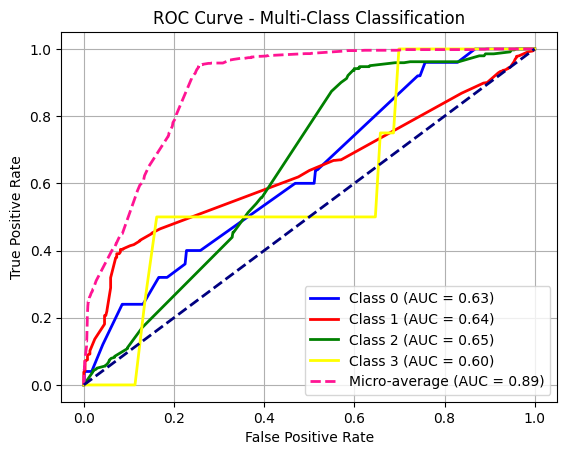

In [109]:
y_true_bin = label_binarize(y_test[0:1000], classes=np.unique(y_test[0:1000]))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plotting the ROC curves for each class
plt.figure()
colors = cycle(['blue', 'red', 'green', 'yellow'])  # You can add more colors if needed
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))

# Plotting the micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', lw=2, linestyle='--', label='Micro-average (AUC = {0:0.2f})'.format(roc_auc["micro"]))

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()


**Adaboost**

In [110]:
from sklearn.ensemble import AdaBoostClassifier

clf_ada_boost = AdaBoostClassifier(n_estimators=200)
clf_ada_boost.fit(x_train,y_train)

AdaBoostClassifier(n_estimators=200)

In [111]:
clf_ada_boost.score(x_test[0:2000],y_test[0:2000])

0.6225

In [112]:
preds2 = clf_ada_boost.predict_proba(x_test[0:1000])

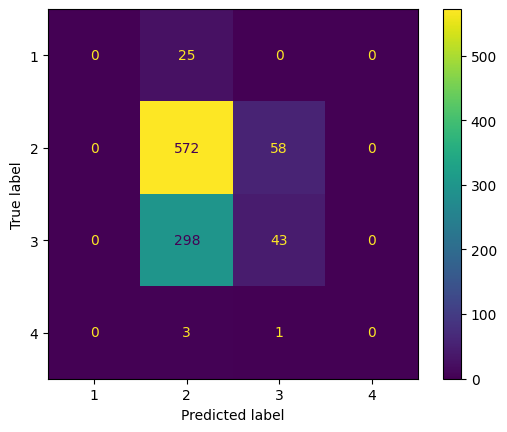

In [113]:
ConfusionMatrixDisplay.from_estimator(clf_ada_boost, x_test[0:1000],y_test[0:1000])

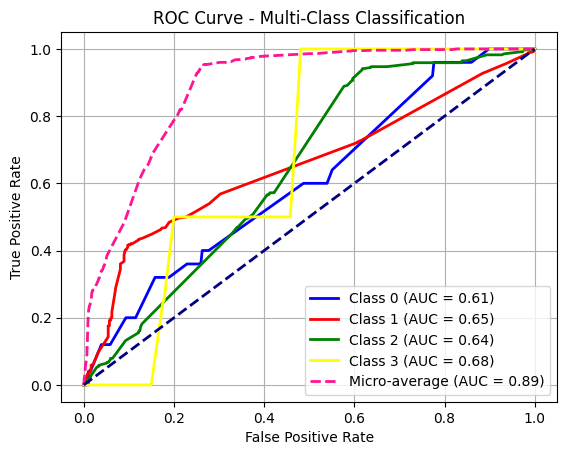

In [114]:
y_true_bin = label_binarize(y_test[0:1000], classes=np.unique(y_test[0:1000]))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plotting the ROC curves for each class
plt.figure()
colors = cycle(['blue', 'red', 'green', 'yellow'])  # You can add more colors if needed
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))

# Plotting the micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', lw=2, linestyle='--', label='Micro-average (AUC = {0:0.2f})'.format(roc_auc["micro"]))

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()


**XGBoost**

In [115]:
from sklearn.ensemble import GradientBoostingClassifier

In [116]:
clf_boost = GradientBoostingClassifier(n_estimators=100, learning_rate=0.01,
 random_state=0).fit(x_train,y_train)

In [117]:
clf_boost.score(x_test,y_test)

0.60689

In [118]:
preds2 = clf_boost.predict_proba(x_test[0:1000])

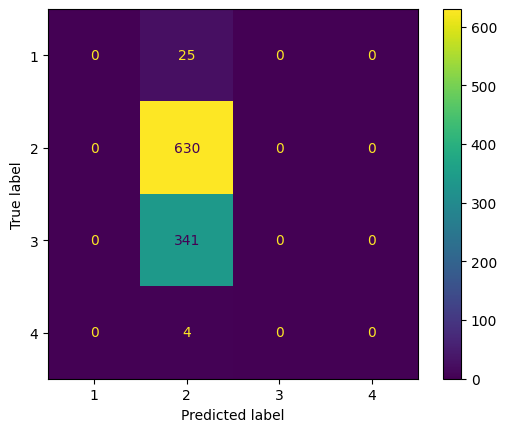

In [119]:
ConfusionMatrixDisplay.from_estimator(clf_boost, x_test[0:1000],y_test[0:1000])

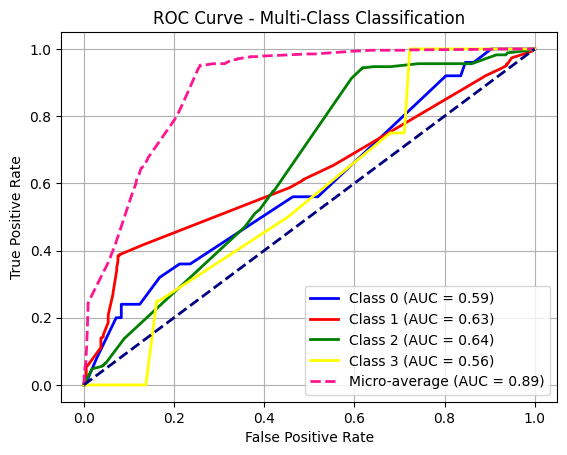

In [120]:
y_true_bin = label_binarize(y_test[0:1000], classes=np.unique(y_test[0:1000]))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], preds2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), preds2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plotting the ROC curves for each class
plt.figure()
colors = cycle(['blue', 'red', 'green', 'yellow'])  # You can add more colors if needed
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))

# Plotting the micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='deeppink', lw=2, linestyle='--', label='Micro-average (AUC = {0:0.2f})'.format(roc_auc["micro"]))

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()
